<a href="https://colab.research.google.com/github/y3998367-commits/flask-todo-app/blob/main/SVD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [13]:
!nvidia-smi


Thu Jul 16 03:56:19 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   73C    P0             31W /   70W |     565MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [14]:
!pip install -q diffusers transformers accelerate moviepy pillow


In [15]:
import diffusers
import transformers
import accelerate

print("Diffusers:", diffusers.__version__)
print("Transformers:", transformers.__version__)
print("Accelerate:", accelerate.__version__)


Diffusers: 0.38.0
Transformers: 5.12.1
Accelerate: 1.14.0


In [16]:
import torch

print("PyTorch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
    print(
        "GPU memory:",
        round(
            torch.cuda.get_device_properties(0).total_memory / 1024**3,
            2
        ),
        "GB"
    )

PyTorch version: 2.11.0+cu128
CUDA available: True
GPU: Tesla T4
GPU memory: 14.56 GB


In [17]:
from google.colab import files

uploaded = files.upload()

Saving 吃面.jpg to 吃面 (1).jpg


In [18]:
from pathlib import Path

PROJECT_DIR = Path("/content/drive/MyDrive/task_b_svd")

INPUT_DIR = PROJECT_DIR / "inputs"
OUTPUT_DIR = PROJECT_DIR / "outputs"
FRAME_DIR = PROJECT_DIR / "frames"
GEOMETRY_DIR = PROJECT_DIR / "geometry"
SCREENSHOT_DIR = PROJECT_DIR / "screenshots"

for folder in [
    INPUT_DIR,
    OUTPUT_DIR,
    FRAME_DIR,
    GEOMETRY_DIR,
    SCREENSHOT_DIR
]:
    folder.mkdir(parents=True, exist_ok=True)

print("项目目录：", PROJECT_DIR)

项目目录： /content/drive/MyDrive/task_b_svd


In [19]:
import shutil
from pathlib import Path

uploaded_filename = next(iter(uploaded))
source_path = Path("/content") / uploaded_filename
destination_path = INPUT_DIR / "input.jpg"

shutil.copy(source_path, destination_path)

print("输入图片已保存：", destination_path)

输入图片已保存： /content/drive/MyDrive/task_b_svd/inputs/input.jpg


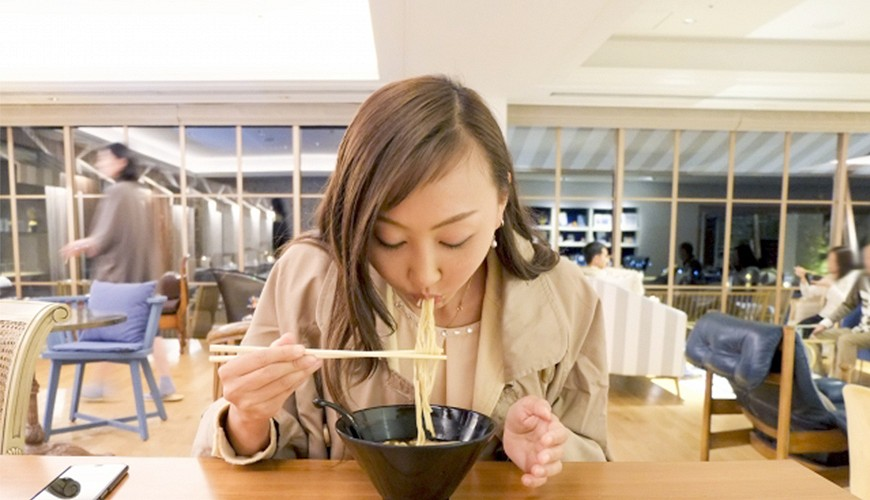

原始尺寸： (870, 500)


In [20]:
from PIL import Image
from IPython.display import display

input_image = Image.open(destination_path).convert("RGB")
display(input_image)

print("原始尺寸：", input_image.size)

In [21]:
import torch
from diffusers import StableVideoDiffusionPipeline

MODEL_ID = "stabilityai/stable-video-diffusion-img2vid-xt"

pipe = StableVideoDiffusionPipeline.from_pretrained(
    MODEL_ID,
    torch_dtype=torch.float16,
    variant="fp16"
)

pipe.enable_model_cpu_offload()
pipe.unet.enable_forward_chunking()

print("SVD-XT 加载完成")

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/520 [00:00<?, ?it/s]

SVD-XT 加载完成


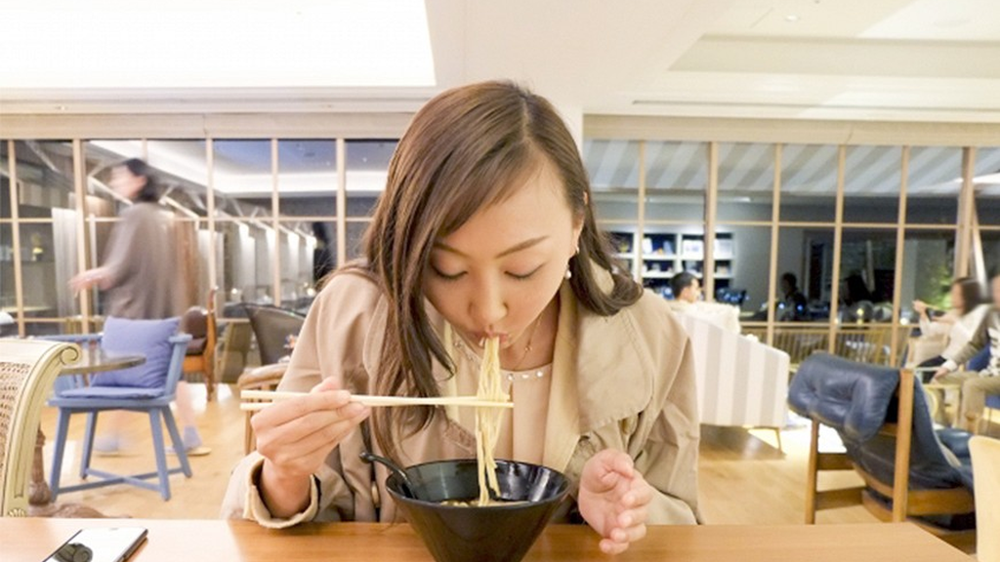

处理后尺寸： (1024, 576)


In [22]:
from PIL import Image


def resize_and_crop(
    image: Image.Image,
    target_width: int = 1024,
    target_height: int = 576
) -> Image.Image:
    image = image.convert("RGB")

    source_width, source_height = image.size
    source_ratio = source_width / source_height
    target_ratio = target_width / target_height

    if source_ratio > target_ratio:
        new_height = target_height
        new_width = round(new_height * source_ratio)
    else:
        new_width = target_width
        new_height = round(new_width / source_ratio)

    image = image.resize(
        (new_width, new_height),
        Image.Resampling.LANCZOS
    )

    left = (new_width - target_width) // 2
    top = (new_height - target_height) // 2

    return image.crop(
        (
            left,
            top,
            left + target_width,
            top + target_height
        )
    )


processed_image = resize_and_crop(input_image)
processed_path = OUTPUT_DIR / "processed_input.png"
processed_image.save(processed_path)

display(processed_image)
print("处理后尺寸：", processed_image.size)

  0%|          | 0/20 [00:00<?, ?it/s]

成功生成帧数： 14
Frame 0


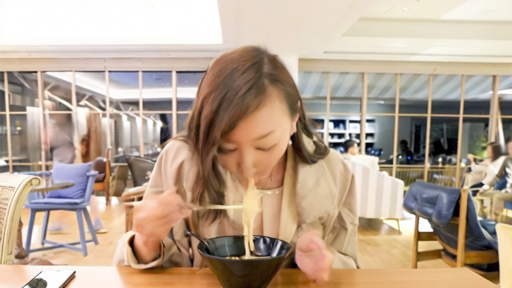

Frame 3


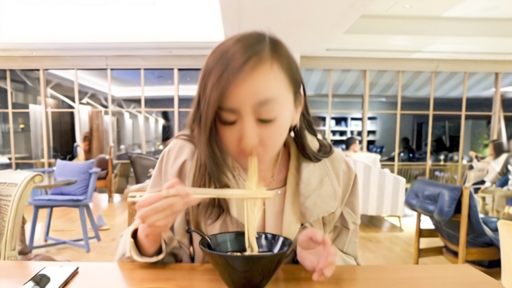

Frame 6


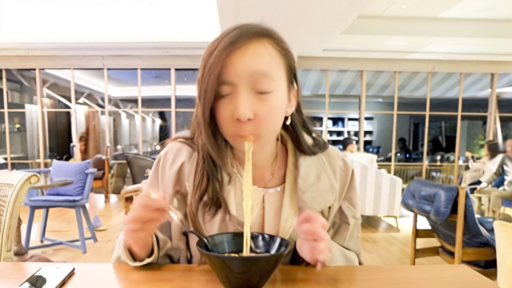

Frame 9


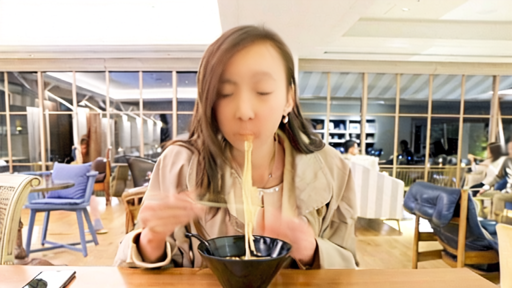

Frame 13


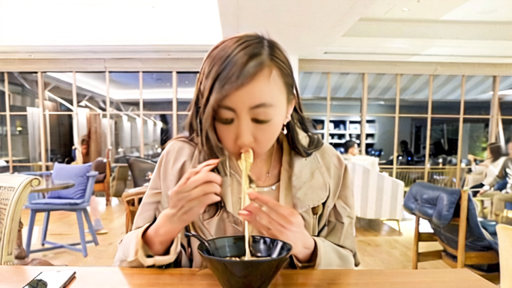

视频已保存： /content/drive/MyDrive/task_b_svd/outputs/svd_test_14frames.mp4


In [23]:

import torch

seed = 42
generator = torch.Generator(device="cpu").manual_seed(seed)

result = pipe(
    image=processed_image,
    num_frames=14,
    num_inference_steps=20,
    motion_bucket_id=100,
    noise_aug_strength=0.02,
    min_guidance_scale=1.0,
    max_guidance_scale=3.0,
    decode_chunk_size=1,
    generator=generator
)

test_frames = result.frames[0]

print("成功生成帧数：", len(test_frames))

from IPython.display import display

selected_indices = [0, 3, 6, 9, 13]

for index in selected_indices:
    print(f"Frame {index}")
    display(test_frames[index].resize((512, 288)))

from diffusers.utils import export_to_video

test_video_path = OUTPUT_DIR / "svd_test_14frames.mp4"

export_to_video(
    test_frames,
    output_video_path=str(test_video_path),
    fps=7
)

print("视频已保存：", test_video_path)

from IPython.display import Video

Video(
    str(test_video_path),
    embed=True,
    width=768
)

In [24]:
import gc
import torch

gc.collect()
torch.cuda.empty_cache()

generator = torch.Generator(device="cpu").manual_seed(42)

result = pipe(
    image=processed_image,
    num_frames=25,
    num_inference_steps=25,
    motion_bucket_id=127,
    noise_aug_strength=0.02,
    min_guidance_scale=1.0,
    max_guidance_scale=3.0,
    decode_chunk_size=1,
    generator=generator
)

basic_frames = result.frames[0]

print("正式生成帧数：", len(basic_frames))

  0%|          | 0/25 [00:00<?, ?it/s]

正式生成帧数： 25


In [25]:
basic_video_path = OUTPUT_DIR / "svd_basic_25frames.mp4"

export_to_video(
    basic_frames,
    output_video_path=str(basic_video_path),
    fps=7
)

Video(
    str(basic_video_path),
    embed=True,
    width=768
)

In [26]:
basic_frame_dir = FRAME_DIR / "basic"
basic_frame_dir.mkdir(parents=True, exist_ok=True)

for index, frame in enumerate(basic_frames):
    frame.save(basic_frame_dir / f"frame_{index:03d}.png")

print("帧已保存：", basic_frame_dir)

帧已保存： /content/drive/MyDrive/task_b_svd/frames/basic


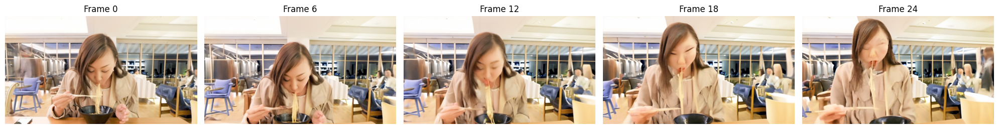

截图已保存： /content/drive/MyDrive/task_b_svd/screenshots/basic_sequence.png


In [27]:
import matplotlib.pyplot as plt

indices = [0, 6, 12, 18, 24]

plt.figure(figsize=(20, 4))

for position, frame_index in enumerate(indices, start=1):
    plt.subplot(1, 5, position)
    plt.imshow(basic_frames[frame_index])
    plt.title(f"Frame {frame_index}")
    plt.axis("off")

plt.tight_layout()

basic_sequence_path = SCREENSHOT_DIR / "basic_sequence.png"
plt.savefig(
    basic_sequence_path,
    dpi=180,
    bbox_inches="tight"
)
plt.show()

print("截图已保存：", basic_sequence_path)

In [28]:
experiments = [
    {
        "name": "low_motion",
        "motion_bucket_id": 50,
        "noise_aug_strength": 0.01
    },
    {
        "name": "medium_motion",
        "motion_bucket_id": 127,
        "noise_aug_strength": 0.02
    },
    {
        "name": "high_motion",
        "motion_bucket_id": 220,
        "noise_aug_strength": 0.05
    }
]

In [29]:
import gc
import torch
from diffusers.utils import export_to_video

parameter_results = {}

for experiment in experiments:
    gc.collect()
    torch.cuda.empty_cache()

    print("正在生成：", experiment["name"])

    generator = torch.Generator(
        device="cpu"
    ).manual_seed(42)

    output = pipe(
        image=processed_image,
        num_frames=14,
        num_inference_steps=20,
        motion_bucket_id=experiment["motion_bucket_id"],
        noise_aug_strength=experiment["noise_aug_strength"],
        min_guidance_scale=1.0,
        max_guidance_scale=3.0,
        decode_chunk_size=1,
        generator=generator
    )

    frames = output.frames[0]
    parameter_results[experiment["name"]] = frames

    video_path = (
        OUTPUT_DIR /
        f'{experiment["name"]}.mp4'
    )

    export_to_video(
        frames,
        output_video_path=str(video_path),
        fps=7
    )

    print("已保存：", video_path)

正在生成： low_motion


  0%|          | 0/20 [00:00<?, ?it/s]

已保存： /content/drive/MyDrive/task_b_svd/outputs/low_motion.mp4
正在生成： medium_motion


  0%|          | 0/20 [00:00<?, ?it/s]

已保存： /content/drive/MyDrive/task_b_svd/outputs/medium_motion.mp4
正在生成： high_motion


  0%|          | 0/20 [00:00<?, ?it/s]

已保存： /content/drive/MyDrive/task_b_svd/outputs/high_motion.mp4


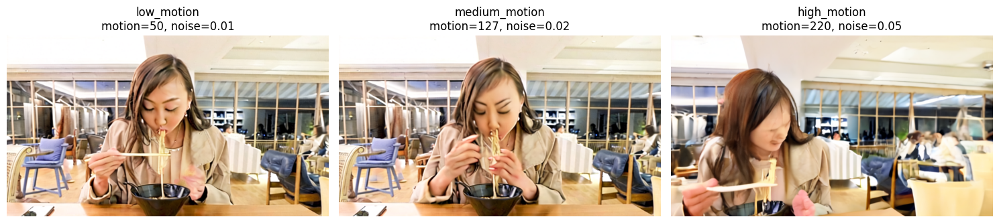

In [30]:
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 5))

for index, experiment in enumerate(experiments, start=1):
    name = experiment["name"]
    frames = parameter_results[name]

    plt.subplot(1, 3, index)
    plt.imshow(frames[-1])
    plt.title(
        f"{name}\n"
        f"motion={experiment['motion_bucket_id']}, "
        f"noise={experiment['noise_aug_strength']}"
    )
    plt.axis("off")

plt.tight_layout()

parameter_comparison_path = (
    SCREENSHOT_DIR /
    "parameter_comparison.png"
)

plt.savefig(
    parameter_comparison_path,
    dpi=180,
    bbox_inches="tight"
)
plt.show()

In [31]:
from transformers import pipeline
import torch

depth_estimator = pipeline(
    task="depth-estimation",
    model="depth-anything/Depth-Anything-V2-Small-hf",
    device=0 if torch.cuda.is_available() else -1
)

print("深度估计模型加载完成")

config.json:   0%|          | 0.00/950 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/99.2M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/287 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/775 [00:00<?, ?B/s]

深度估计模型加载完成


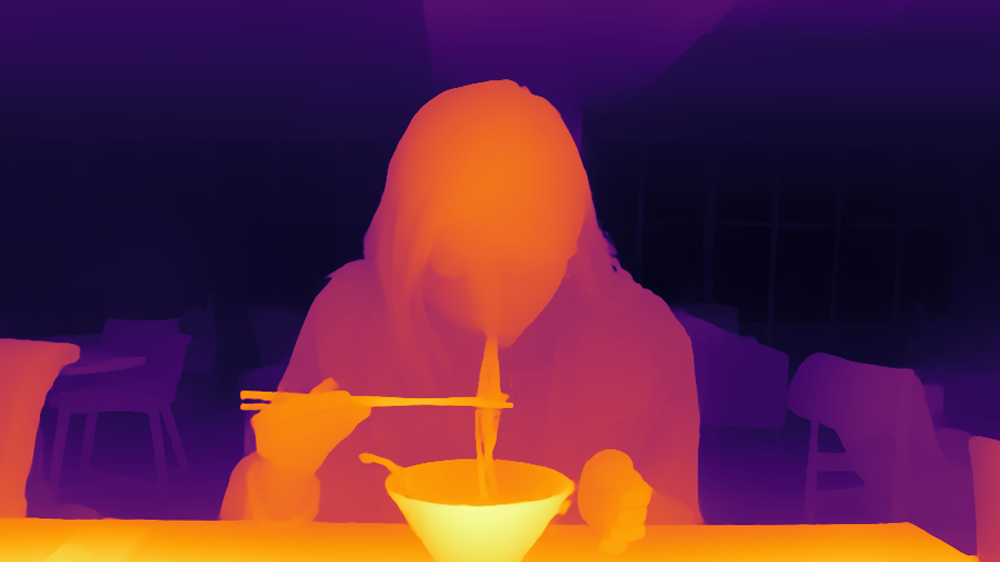

In [32]:
import cv2
import numpy as np
from PIL import Image
from IPython.display import display

depth_result = depth_estimator(processed_image)

depth_image = depth_result["depth"]
depth_array = np.asarray(depth_image).astype(np.float32)

depth_array = cv2.resize(
    depth_array,
    processed_image.size,
    interpolation=cv2.INTER_CUBIC
)

depth_array = (
    depth_array - depth_array.min()
) / (
    depth_array.max() - depth_array.min() + 1e-8
)

depth_uint8 = np.clip(
    depth_array * 255,
    0,
    255
).astype(np.uint8)

depth_colour = cv2.applyColorMap(
    depth_uint8,
    cv2.COLORMAP_INFERNO
)

depth_colour_rgb = cv2.cvtColor(
    depth_colour,
    cv2.COLOR_BGR2RGB
)

depth_visualisation = Image.fromarray(depth_colour_rgb)
depth_path = GEOMETRY_DIR / "depth.png"
depth_visualisation.save(depth_path)

display(depth_visualisation)

In [33]:
import cv2
import numpy as np

rgb = np.asarray(processed_image)
height, width = depth_array.shape


def depth_warp(
    rgb_image,
    relative_depth,
    camera_shift
):
    y_grid, x_grid = np.indices(
        relative_depth.shape
    )

    near_weight = 1.0 - relative_depth
    disparity = camera_shift * near_weight

    map_x = (
        x_grid.astype(np.float32) -
        disparity.astype(np.float32)
    )

    map_y = y_grid.astype(np.float32)

    warped = cv2.remap(
        rgb_image,
        map_x,
        map_y,
        interpolation=cv2.INTER_LINEAR,
        borderMode=cv2.BORDER_REFLECT
    )

    return warped


geometry_frames = []

trajectory = np.sin(
    np.linspace(0, np.pi, 25)
)

for index, trajectory_value in enumerate(trajectory):
    pixel_shift = 45 * trajectory_value

    warped = depth_warp(
        rgb,
        depth_array,
        pixel_shift
    )

    warped_image = Image.fromarray(warped)
    geometry_frames.append(warped_image)

    warped_image.save(
        GEOMETRY_DIR /
        f"warped_{index:03d}.png"
    )

print("几何重投影帧已生成")

几何重投影帧已生成


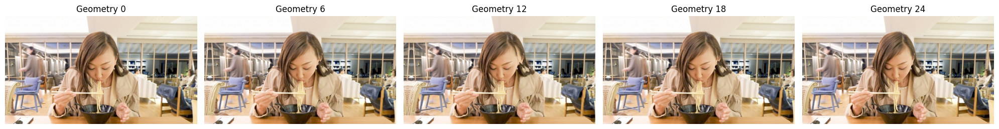

In [34]:
import matplotlib.pyplot as plt

indices = [0, 6, 12, 18, 24]

plt.figure(figsize=(20, 4))

for position, frame_index in enumerate(indices, start=1):
    plt.subplot(1, 5, position)
    plt.imshow(geometry_frames[frame_index])
    plt.title(f"Geometry {frame_index}")
    plt.axis("off")

plt.tight_layout()

geometry_sequence_path = (
    SCREENSHOT_DIR /
    "geometry_sequence.png"
)

plt.savefig(
    geometry_sequence_path,
    dpi=180,
    bbox_inches="tight"
)
plt.show()

In [35]:
geometry_video_path = (
    OUTPUT_DIR /
    "geometry_warp_only.mp4"
)

export_to_video(
    geometry_frames,
    output_video_path=str(geometry_video_path),
    fps=7
)

Video(
    str(geometry_video_path),
    embed=True,
    width=768
)

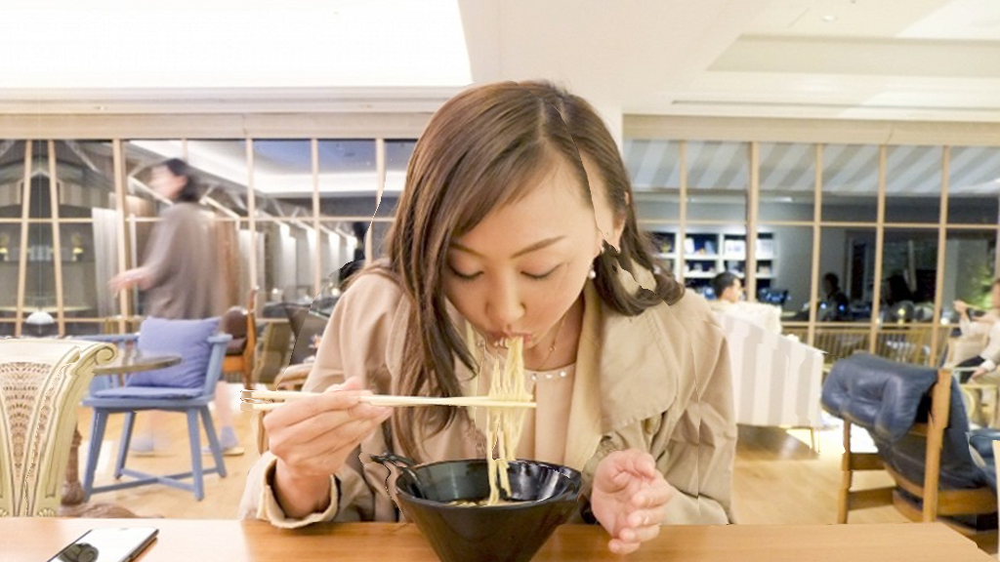

In [38]:
geometry_condition_image = geometry_frames[12]
display(geometry_condition_image)

In [39]:
generator = torch.Generator(
    device="cpu"
).manual_seed(42)

geometry_result = pipe(
    image=geometry_condition_image,
    num_frames=14,
    num_inference_steps=20,
    motion_bucket_id=80,
    noise_aug_strength=0.015,
    min_guidance_scale=1.0,
    max_guidance_scale=3.0,
    decode_chunk_size=1,
    generator=generator
)

geometry_svd_frames = geometry_result.frames[0]

  0%|          | 0/20 [00:00<?, ?it/s]

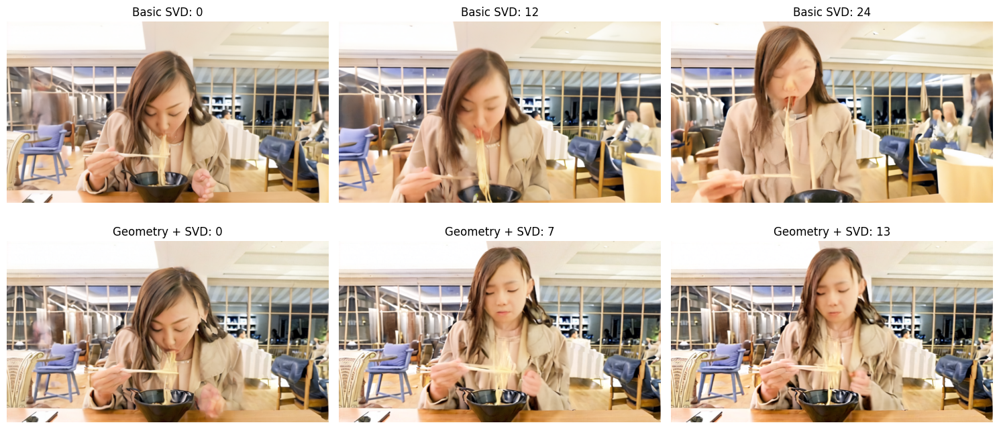

In [40]:
import matplotlib.pyplot as plt

basic_indices = [
    0,
    len(basic_frames) // 2,
    len(basic_frames) - 1
]

geometry_indices = [
    0,
    len(geometry_svd_frames) // 2,
    len(geometry_svd_frames) - 1
]

plt.figure(figsize=(15, 7))

for column, frame_index in enumerate(
    basic_indices,
    start=1
):
    plt.subplot(2, 3, column)
    plt.imshow(basic_frames[frame_index])
    plt.title(f"Basic SVD: {frame_index}")
    plt.axis("off")

for column, frame_index in enumerate(
    geometry_indices,
    start=1
):
    plt.subplot(2, 3, column + 3)
    plt.imshow(geometry_svd_frames[frame_index])
    plt.title(f"Geometry + SVD: {frame_index}")
    plt.axis("off")

plt.tight_layout()

final_comparison_path = (
    SCREENSHOT_DIR /
    "basic_vs_geometry_svd.png"
)

plt.savefig(
    final_comparison_path,
    dpi=180,
    bbox_inches="tight"
)

plt.show()